## References

* HAT-P-44 b [(Fukui+16a)](http://iopscience.iop.org/article/10.3847/0004-637X/819/1/27/pdf)
* K2-3d [(Fukui+16b)](http://iopscience.iop.org/article/10.3847/0004-6256/152/6/171) 
* [HAT-P-44 b ref](http://exoplanet.eu/catalog/HAT-P-44_b/)
* [limb-darkening measurement](https://www.aanda.org/articles/aa/pdf/2013/12/aa22079-13.pdf)
* [stellar limb darkening and exoplanetary transits (Howarth 2011)](https://arxiv.org/pdf/1106.4659.pdf)

## To do

* See Narita et al. (2013) for modeling the ground-based transit light curves
* time stamps of the photometric data are placed onto the BJD$_{TDB}$ system using the code by Eastman et al. (2010)
* 

In [1]:
!python --version

Python 2.7.13 :: Continuum Analytics, Inc.


In [2]:
import os
os.environ['CONDA_DEFAULT_ENV']

'moscatel'

## import and parse csv

In [3]:
import glob
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
#import multiprocessing

In [4]:
import getpass
from tqdm import tqdm

data_dir = '/home/'+getpass.getuser()+'/data/transit/hatp44_data/lc_hatp44_msct_170215'
file_list=glob.glob(data_dir+'/*.dat')
file_list.sort()

In [5]:
file_list

['/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_g_hatp44_170215_t2_c13_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_g_hatp44_170215_t2_c1_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_g_hatp44_170215_t2_c3_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_r_hatp44_170215_t2_c13_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_r_hatp44_170215_t2_c1_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_r_hatp44_170215_t2_c3_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_z_hatp44_170215_t2_c13_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_z_hatp44_170215_t2_c1_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_170215/lcf_msct_z_hatp44_170215_t2_c3_r9-14.bjd.dat',
 '/home/jp/data/transit/hatp44_data/lc_hatp44_msct_1

## import lc

In [6]:
name='hatp44'
date='170215'
target_star_id='2'
comparison_star_id='1'#13, #3
radii_range='9-14'

DF={}
bands='g,r,z'.split(',')
for b in bands:
    fname='lcf_msct_'+b+'_'+name+'_'+date+'_t'+target_star_id+'_c'+comparison_star_id+'_r'+radii_range+'.bjd.dat'
    df=pd.read_csv(os.path.join(data_dir,fname), delimiter=' ', parse_dates=True)
    df = df.set_index('BJD(TDB)-2450000')
    try:
        df=df.drop('Unnamed: 20',1)
    except:
        pass
    #df.head()
    DF[b]=df
    
DF['z'].head()

,airmass,sky(ADU),dx(pix),dy(pix),fwhm(pix),peak(ADU),frame,flux(r=9.0),err(r=9.0),flux(r=10.0),err(r=10.0),flux(r=11.0),err(r=11.0),flux(r=12.0),err(r=12.0),flux(r=13.0),err(r=13.0),flux(r=14.0),err(r=14.0)
BJD(TDB)-2450000,,,,,,,,,,,,,,,,,,,
7800.099704,1.9195,770.0,1.571,1.098,9.23,8484.4,MSCL2_1702150416,1.006060,0.002415,1.004150,0.002430,1.002697,0.002462,1.001681,0.002506,1.001059,0.002561,1.000910,0.002623
7800.100445,1.9101,760.9,1.183,1.363,8.84,8832.8,MSCL2_1702150417,1.003645,0.002405,1.003763,0.002425,1.004157,0.002461,1.003590,0.002507,1.004013,0.002564,1.002980,0.002624
7800.101185,1.9007,759.6,2.001,0.490,8.45,9166.4,MSCL2_1702150418,1.011944,0.002418,1.010547,0.002436,1.009671,0.002471,1.008578,0.002515,1.007796,0.002569,1.007015,0.002631
7800.101926,1.8915,758.3,2.197,1.278,8.64,9004.7,MSCL2_1702150419,1.000177,0.002418,0.999711,0.002433,0.999450,0.002466,0.998745,0.002509,0.999686,0.002565,0.999818,0.002626
7800.102655,1.8826,754.0,1.232,1.128,8.03,9894.7,MSCL2_1702150420,1.008416,0.002377,1.008160,0.002401,1.008227,0.002440,1.008178,0.002490,1.007604,0.002546,1.007852,0.002610


## g-band

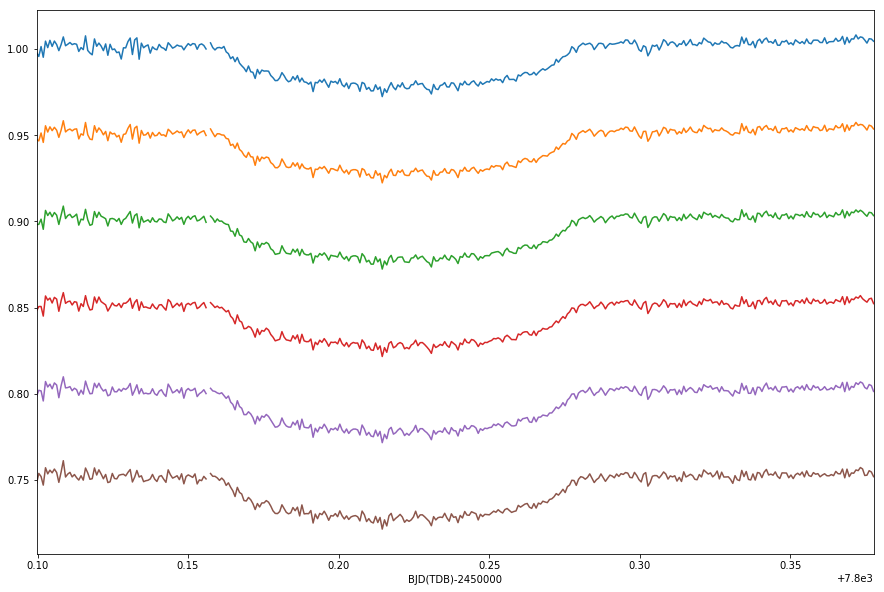

In [7]:
#fluxes
df=DF['g']
fluxes=df[df.columns[7:][::2]]
fluxes=fluxes[np.abs(fluxes-fluxes.mean())<=(3*fluxes.std())]
#add vertical offset
offset=0.05
for i,col in enumerate(fluxes.columns):
    fluxes[col].apply(lambda x : x-offset*i).plot(figsize=(15,10))

## 3 bands one star

In [8]:
df.columns

Index([u'airmass', u'sky(ADU)', u'dx(pix)', u'dy(pix)', u'fwhm(pix)',
       u'peak(ADU)', u'frame', u'flux(r=9.0)', u'err(r=9.0)', u'flux(r=10.0)',
       u'err(r=10.0)', u'flux(r=11.0)', u'err(r=11.0)', u'flux(r=12.0)',
       u'err(r=12.0)', u'flux(r=13.0)', u'err(r=13.0)', u'flux(r=14.0)',
       u'err(r=14.0)'],
      dtype='object')

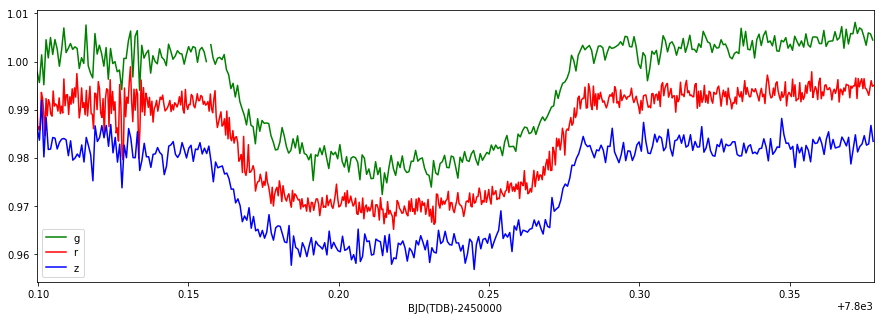

In [9]:
#add vertical offset
offset=0.01
col_id=df.columns[7] #flux(r=9.0)
colors='g,r,b'.split(',')
for i,(key,c) in enumerate(zip(sorted(DF.keys()),colors)):
    df=DF[key]
    fluxes=df[df.columns[7:][::2]]
    fluxes=fluxes[np.abs(fluxes-fluxes.mean())<=(3*fluxes.std())]
    fluxes[col_id].apply(lambda x : x-offset*i).plot(color=c,figsize=(15,5),label=key)
    #fluxes[col_id].plot(color=c,figsize=(15,5),label=key, marker='.', alpha=0.5)
plt.legend()

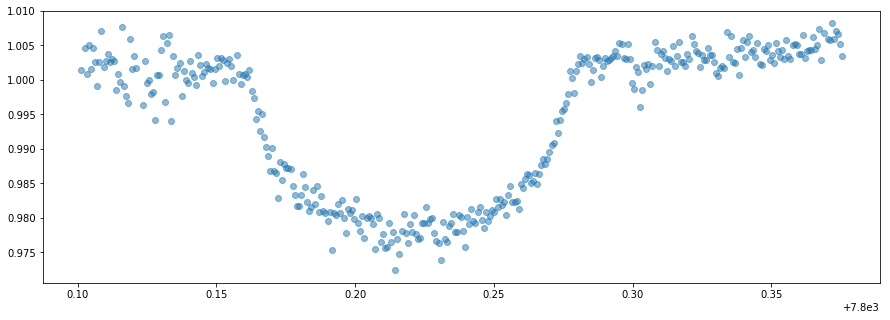

In [10]:
idx=6 #flux(r=9.0)
key='g'
df_z=DF[key]
#move frame column
df_z=df_z.drop('frame', axis=1)
#remove outliers
df_z=df_z[np.abs(df_z-df_z.mean())<=(3*df_z.std())]
#dropna
df_z=df_z.dropna(axis=0)

#clip the right side of baseline
clip=40
#df_z=df_z[:-clip]

t=df_z.index.values
f=df_z[df_z.columns[idx]].values

fig = plt.figure(figsize=(15,5))
plt.plot(t, f, 'o', alpha=0.5)

In [11]:
#(pd.to_datetime(df_z.index))#.to_julian_date
#df_z.index.to_datetime().to_julian_date

## building the model

Based on Hartman et al. [2014](http://iopscience.iop.org/article/10.1088/0004-6256/147/6/128/pdf)
* Teff: 5295±100
* P: 4.301219±0.000019
* Tc: 2455696.93695±0.00024
* T14: 0.1302±0.0008
* Rp/R*: 0.1343±0.0010
* c1, i: 0.3648
* c2, i: 0.2817

Lightcurve parameters
* i: 88.7+0.6-1.6
* Mp: 0.347±0.077
* Rp: 1.523+0.442-0.226
* rho_p: 0.12
* log g: 2.55±0.19
* a: 0.0509+0.0014−0.0008
* Teq: 1238+173-107

In [12]:
def scaled_a(p, t14, k, i=np.pi/2, b=0):
    numer = np.sqrt( (k + 1)**2 - b**2 )
    denom = np.sin(i) * np.sin(t14 * np.pi / p)
    return float(numer / denom)

In [13]:
#k,tc,a,inc,u1,u2
a_=0.0509
t14_ = 0.1302
k_ = 0.1343
tc_ = 2455696.93695
p_ = 4.301219
i_ =1.548107 #88.7 deg
u1_, u2_ = 0.4, 0.4

a_scaled_ = scaled_a(p_, t14_, k_, i_, b=0)
theta_true=[k_,tc_,a_scaled_, u1_, u2_]

In [14]:
tc = t.mean()
p = 4.3
k = np.sqrt(0.015)
inc = np.pi/2
t14 = 2.8/24
u1 = 0.4
u2 = 0.4
a = scaled_a(p, t14, k, i=np.pi/2)
# ls = np.log(f.std())
# k0 = 0
# theta = [k,tc,a,i,u1,u2,ls,k0]
theta = [k,tc,a,inc,u1,u2]
print ("initial guess: {}".format(theta))

initial guess: [0.1224744871391589, 7800.2391136311471, 13.18482235546915, 1.5707963267948966, 0.4, 0.4]


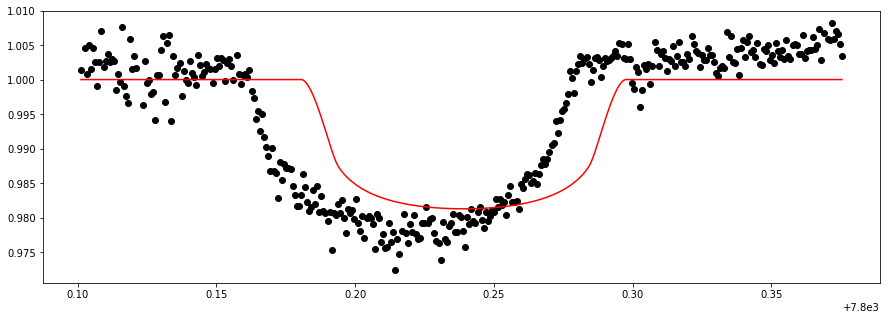

In [15]:
from pytransit import MandelAgol
MA = MandelAgol()

def model_u(theta, t, p):
    k,tc,a,i,u1,u2 = theta
    m = MA.evaluate(t, k, (u1, u2), tc, p, a, i)
    return m

fig = plt.figure(figsize=(15,5))
plt.plot(t, f, 'ko', t, model_u(theta, t, p), 'r-');

## MLE

* p, period
* k, r_planet/r_star
* t14, transit duration
* i, inclination
* b, impact paramter
* tc, mid-point transit time
* u1, u2, limb-darkening coeffs
* a_scaled

In [16]:
import scipy.optimize as op

def obj(theta, t, p, f):
    m = model_u(theta, t, p)
    return np.sum((m-f)**2)

print ("cost before: {}".format(obj(theta, t, p, f)))
res = op.minimize(obj, theta, args=(t, p, f), method='nelder-mead')

print ("cost after: {}".format(obj(res.x, t, p, f)))

cost before: 0.0159731818424
cost after: 0.00419201131138


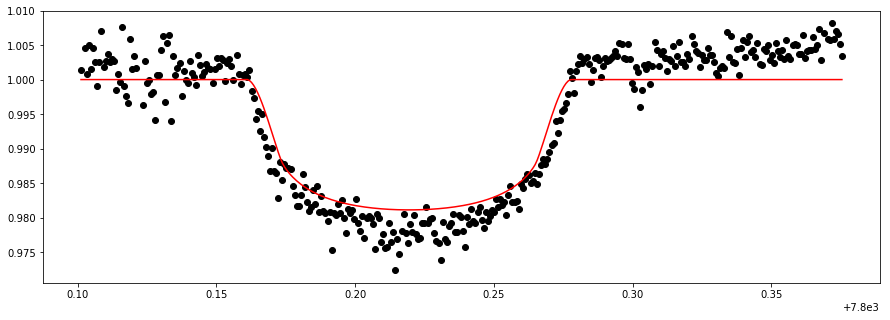

In [17]:
fig = plt.figure(figsize=(15,5))
plt.plot(t, f, 'ko', t, model_u(res.x, t, p), 'r-');

In [18]:
#df_z=DF[key]

#excluded outliers
uncertainty=df_z['err(r=9.0)'].values#.dropna()
peak_flux=df_z['peak(ADU)'].values#.dropna()
fwhm = df_z['fwhm(pix)'].values#.dropna()
xcenter = df_z['dx(pix)'].values#.dropna()
ycenter = df_z['dy(pix)'].values#.dropna()

In [19]:
#systematics parameters
k0, k1, k2, k3, k4 = [0]*5
#log flux uncertainty
ls = np.log(np.nanstd(f))

#parameters vector: 6 free, 7 input
theta = [k,tc,a,inc,u1,u2,ls,k0,k1,k2,k3,k4]

#systematics model (time-dependent)
def model_s(theta, fwhm, uncertainty, xcenter, ycenter, t):
    #functional form of systematics model
    dummy = np.ones(len(fwhm))
    s = (np.array(theta)*np.c_[fwhm, xcenter, ycenter, dummy, t]).sum(axis=1)
    #s = [np.sum(c[k] * x**k) for k in np.arange(N)]
    # unpack 6 free params
    #a,b,c,d,e = theta
    #s = a + b*t + c*fwhm + d*xcenter + e*ycenter
    return s

def loglike(theta, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_mod=False, ret_sys=False, ret_full = False):
    ls = theta[6]
    m = model_u(theta[:6], t, p)
    s = model_s(theta[7:], fwhm, uncertainty, xcenter, ycenter, t) # #add sys model
    
    if ret_mod:
        return m
    if ret_sys:
        return s
    if ret_full:
        return m+s
    
    resid = f - m - s
    
    inv_sig2 = np.exp(-2*ls)
    
    return -0.5*(np.sum((resid)**2 * inv_sig2 + 2*ls))

#negative log-likelihood
nll = lambda *x: -loglike(*x)

print ("NLL before: {}".format(nll(theta, t, f, p, fwhm, uncertainty, xcenter, ycenter)))
result = op.minimize(nll, theta, args=(t, f, p, fwhm, uncertainty, xcenter, ycenter), method='nelder-mead')
print ("NLL after: {}".format(nll(result.x, t, f, p, fwhm, uncertainty, xcenter, ycenter)))

NLL before: -1592.05817288
NLL after: -2001.85520721


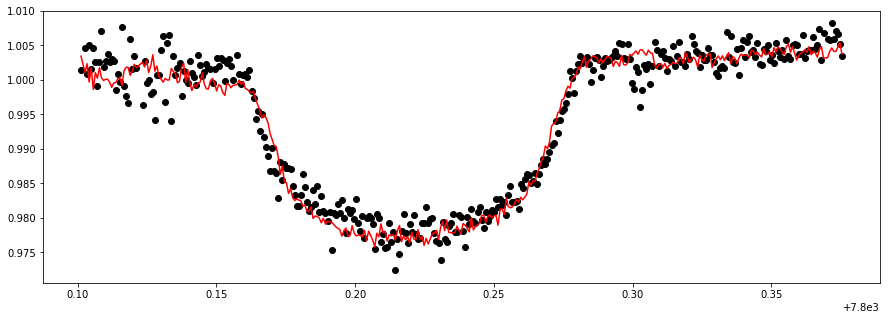

In [20]:
f_pred = loglike(result.x, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True)
fig = plt.figure(figsize=(15,5))
plt.plot(t, f, 'ko', t, f_pred, 'r-')

## MCMC

Note the [difference](https://stats.stackexchange.com/questions/74082/what-is-the-difference-in-bayesian-estimate-and-maximum-likelihood-estimate) in interpretation of their results.

In [21]:
def logprob(theta, t, f, p, fwhm, uncertainty, xcenter, ycenter, up=None):

    k,tc,a,i,u1,u2,ls,k0,k1,k2,k3,k4 = theta

    if u1 < 0 or u1 > 2 or u2 < -1 or u2 > 1 or k < 0 or k > 1 or i > np.pi/2:
        return -np.inf

    lp = 0
    #u prior
    if up is not None:
        lp += np.log(stats.norm.pdf(u1, loc=up[0], scale=up[1]))
        lp += np.log(stats.norm.pdf(u2, loc=up[2], scale=up[3]))

    ll = loglike(theta, t, f, p, fwhm, uncertainty, xcenter, ycenter)

    if np.isnan(ll).any():
        return -np.inf
    
    #total: sum of prior and likelihood
    return lp + ll

#negative log prob
nlp = lambda *x: -logprob(*x)

In [22]:
from emcee import MHSampler, EnsembleSampler
from emcee.utils import sample_ball
from tqdm import tqdm

ndim = len(theta)
nwalkers = 8 * ndim if ndim > 12 else 16 * ndim
nsteps1 = 1000

args = t, f, p, fwhm, uncertainty, xcenter, ycenter
sampler = EnsembleSampler(nwalkers, ndim, logprob,
    args=args, threads=1)

#random initial condition
pos0 = sample_ball(theta, [1e-4]*ndim, nwalkers)
'''pos0 = [np.array(initial) + 1e-8 * np.random.randn(ndim)
      for i in xrange(nwalkers)]'''

#begin
for pos,_,_ in tqdm(sampler.sample(pos0, iterations=nsteps1)):
    pass

0it [00:00, ?it/s]/home/jp/miniconda2/envs/moscatel/lib/python2.7/site-packages/emcee/ensemble.py:335: RuntimeWarning: invalid value encountered in subtract
  lnpdiff = (self.dim - 1.) * np.log(zz) + newlnprob - lnprob0
/home/jp/miniconda2/envs/moscatel/lib/python2.7/site-packages/emcee/ensemble.py:336: RuntimeWarning: invalid value encountered in greater
  accept = (lnpdiff > np.log(self._random.rand(len(lnpdiff))))
1000it [01:49, 10.24it/s]


## Parameter best estimates

In [23]:
param_names='k,tc,a,i,u1,u2,ls,k0,k1,k2,k3,k4'.split(',')

for n, i,j in zip(param_names, theta, sampler.flatchain.mean(axis=0)): 
    print('{0}: init={1}, post={2}'.format(n,i,j))

k: init=0.122474487139, post=0.137245337951
tc: init=7800.23911363, post=7800.22129466
a: init=13.1848223555, post=12.7412334309
i: init=1.57079632679, post=1.55949836327
u1: init=0.4, post=0.636449448331
u2: init=0.4, post=-0.0826644318247
ls: init=-4.54232499458, post=-5.7075948704
k0: init=0, post=-0.00107234785417
k1: init=0, post=0.000297903360826
k2: init=0, post=-0.000603920440211
k3: init=0, post=-9.44394658332
k4: init=0, post=0.00121212318527


In [24]:
sampler.flatlnprobability.max()

2125.0976863520132

In [25]:
#sampler.flatchain.mean(axis=0)

max_idx=np.argmax(sampler.flatlnprobability)

#posterior of parameter vector
pv=sampler.flatchain[max_idx]
pv

array([  1.38717474e-01,   7.80021975e+03,   1.24055943e+01,
         1.56619706e+00,   9.07625707e-01,  -3.97458145e-01,
        -6.31781361e+00,  -1.14215106e-03,  -6.67483747e-04,
        -4.36088866e-04,  -9.77698419e+01,   1.25356385e-02])

## Initial results

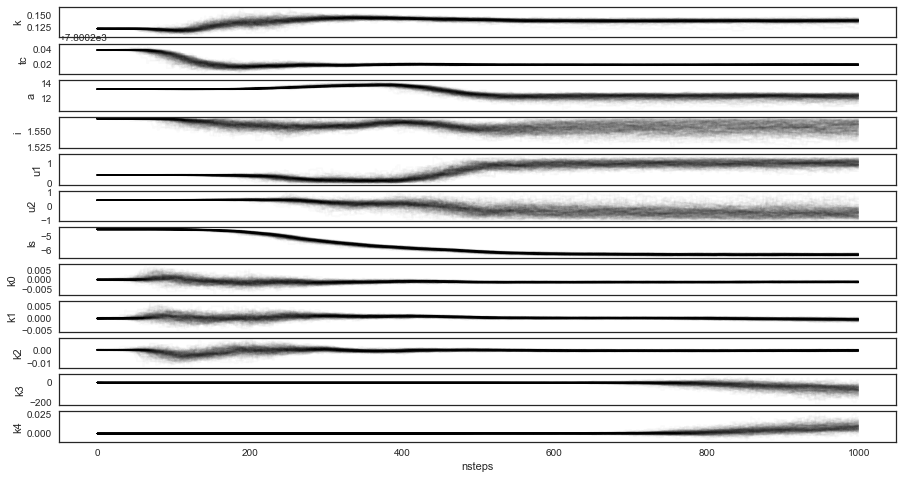

In [26]:
import seaborn as sb

chain = sampler.chain

with sb.axes_style('white'):
    nwalkers, nsteps, ndim = chain.shape
    fig, axs = plt.subplots(ndim, 1, figsize=(15,ndim/1.5), sharex=True)
    [axs.flat[i].plot(c, drawstyle='steps', color='k', alpha=4./nwalkers) for i,c in enumerate(chain.T)]
    [axs.flat[i].set_ylabel(l) for i,l in enumerate(param_names)]
    
plt.xlabel('nsteps')

In [27]:
burn = 500
#burn-in phase removed
#sampler.chain[:,burn:,:].shape

nsteps2 = 2000

sampler.reset()
for pos,_,_ in tqdm(sampler.sample(pos, iterations=nsteps2)):
    pass

2000it [04:06,  8.12it/s]


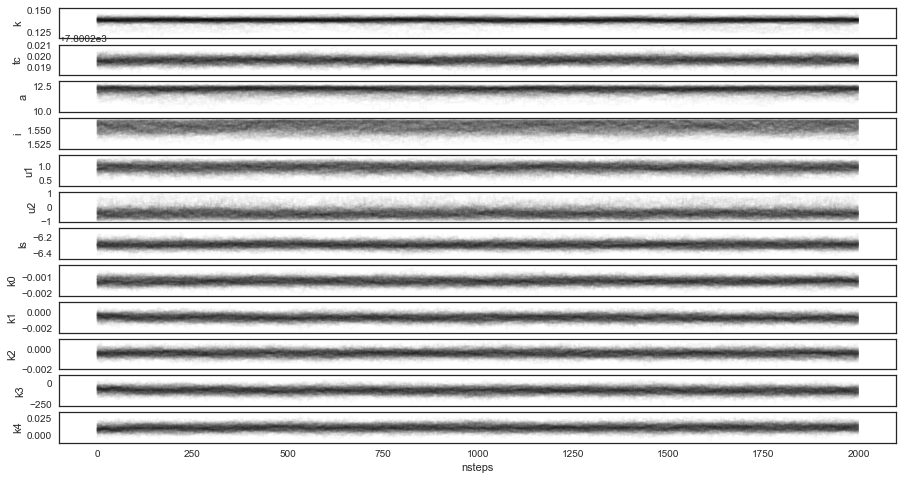

In [28]:
import seaborn as sb

chain = sampler.chain

with sb.axes_style('white'):
    nwalkers, nsteps, ndim = chain.shape
    fig, axs = plt.subplots(ndim, 1, figsize=(15,ndim/1.5), sharex=True)
    [axs.flat[i].plot(c, drawstyle='steps', color='k', alpha=4./nwalkers) for i,c in enumerate(chain.T)]
    [axs.flat[i].set_ylabel(l) for i,l in enumerate(param_names)]
    
plt.xlabel('nsteps')

## Results

In [29]:
#using full chain excluding burn-in
max_idx=np.argmax(sampler.flatlnprobability)

#posterior of parameter vector
pv=sampler.flatchain[max_idx]
pv

array([  1.39091575e-01,   7.80021956e+03,   1.23091359e+01,
         1.55799997e+00,   1.04078154e+00,  -5.94422738e-01,
        -6.31099751e+00,  -1.22807142e-03,  -3.90144826e-04,
        -5.24408282e-04,  -5.97472826e+01,   7.66117066e-03])

In [30]:
#flat chain
fc=sampler.chain[:,burn:,:].reshape(-1, ndim)

fc.mean(axis=0)

array([  1.39057053e-01,   7.80021961e+03,   1.21398641e+01,
         1.55755667e+00,   9.64826642e-01,  -4.26048300e-01,
        -6.29012472e+00,  -1.21709758e-03,  -6.49363154e-04,
        -3.93982584e-04,  -8.73758096e+01,   1.12031857e-02])

In [31]:
#posteriors: draw 100 random from fc
mod_sys = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]
sys = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_sys=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]
mod = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_mod=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]

### systematics only

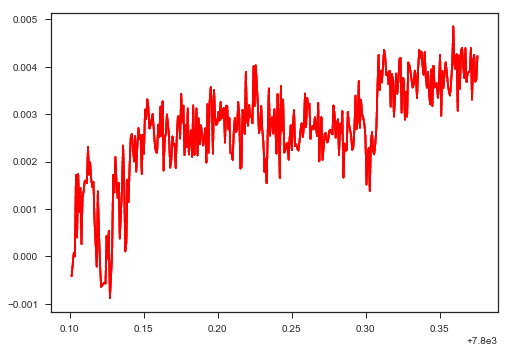

In [32]:
import seaborn as sb
with sb.axes_style('ticks'):
    for s in sys:
        plt.plot(t, s, 'r-', alpha=0.03)

### data - systematics

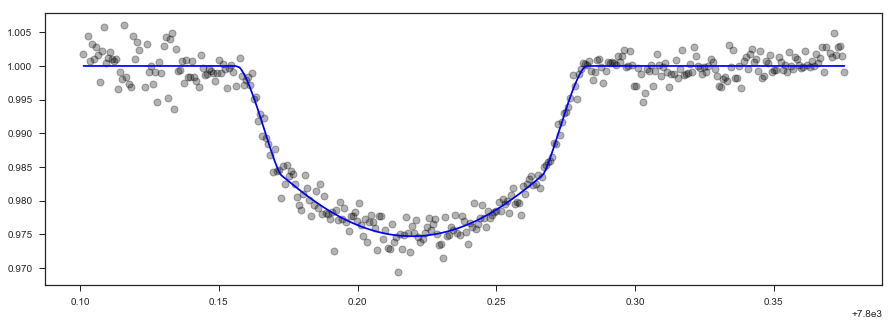

In [33]:
import seaborn as sb
n=0
with sb.axes_style('ticks'):
    fig, ax = plt.subplots(1, 1, figsize=(15,5))
    ax.plot(t, f-sys[n], linestyle='none', marker='o',
        color='k', alpha=0.3, mew=1, mec='k')
    ax.plot(t, mod[n], 'b-')

### model + systematics

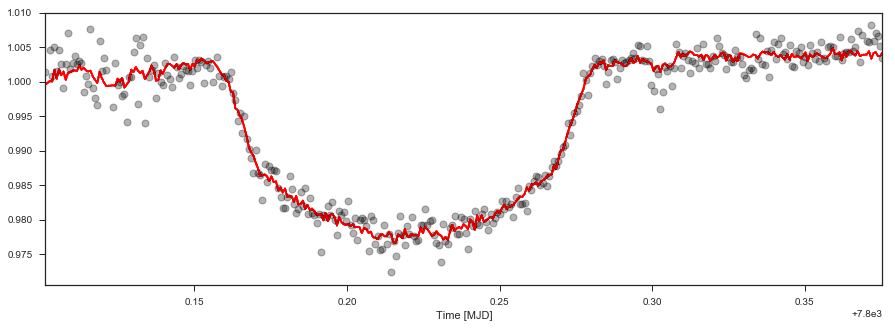

In [34]:
#posterior
ps = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]

with sb.axes_style('ticks'):
    fig, ax = plt.subplots(1, 1, figsize=(15,5))
    ax.plot(t, f, linestyle='none', marker='o',
        color='k', alpha=0.3, mew=1, mec='k')
    for s in ps:
        ax.plot(t, s, 'r-', alpha=0.03)
    plt.setp(ax, xlabel='Time [MJD]', xlim=(t.min(), t.max()))

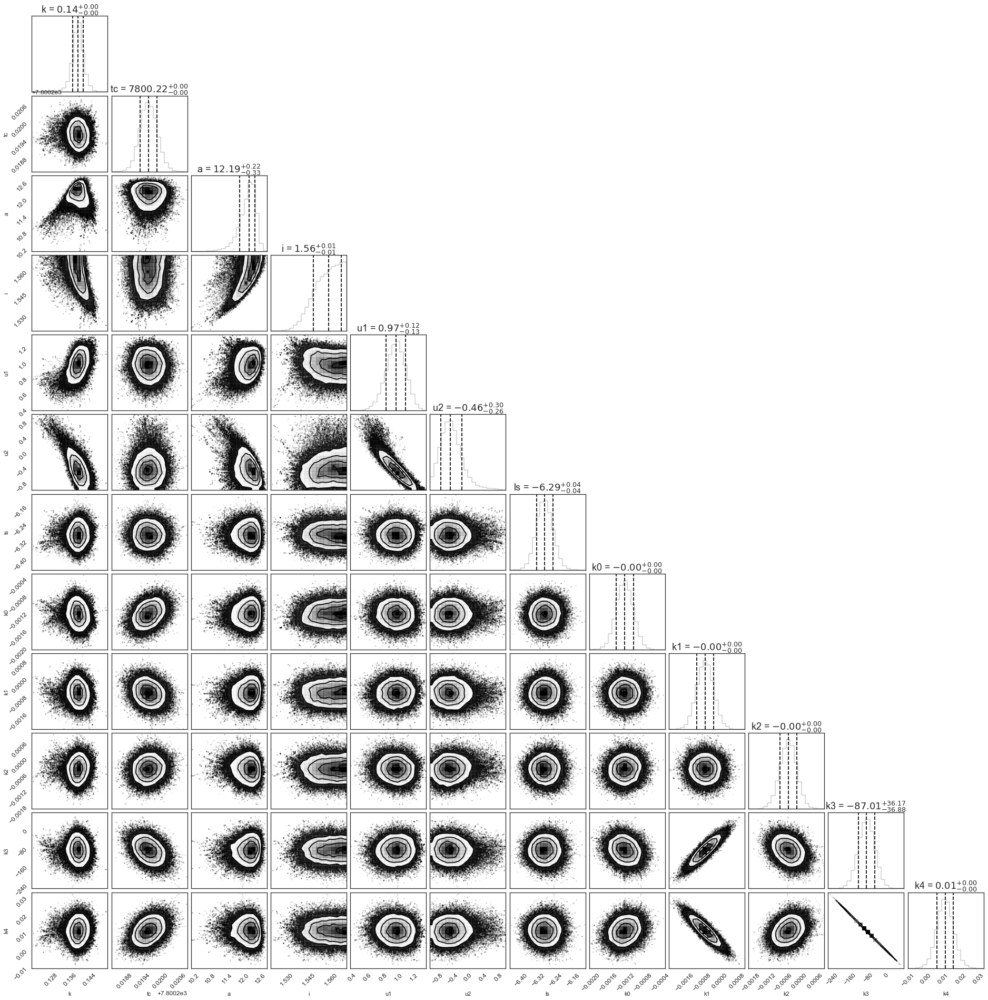

In [35]:
plt.rcParams['ytick.labelsize'] = 'medium'
plt.rcParams['xtick.labelsize'] = 'medium'

import corner

with sb.axes_style('white'):
    corner.corner(fc, labels=param_names, 
                  quantiles=[0.16, 0.5, 0.84], 
                  show_titles=True, title_kwargs={"fontsize": 18});

correlation: u1, u2; k1, k3; i, a

In [36]:
for n, i in zip(param_names, pv): 
    print('{0}: {1:.4f}'.format(n,i))

k: 0.1391
tc: 7800.2196
a: 12.3091
i: 1.5580
u1: 1.0408
u2: -0.5944
ls: -6.3110
k0: -0.0012
k1: -0.0004
k2: -0.0005
k3: -59.7473
k4: 0.0077


In [37]:
final_theta={}
final_theta['g']=pv

Compare the above results to previous [published results](http://exoplanet.eu/catalog/HAT-P-44_b/).

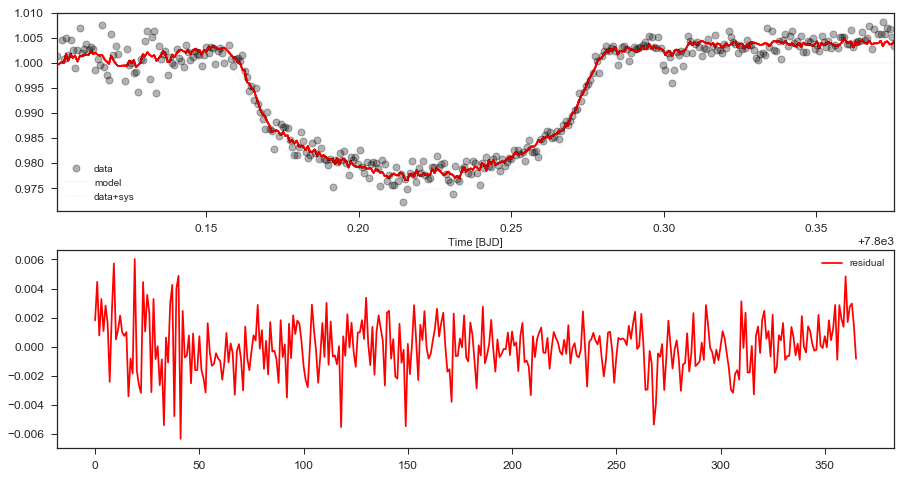

In [38]:
with sb.axes_style('ticks'):
    fig, ax = plt.subplots(2, 1, figsize=(15,8))
    #data
    ax[0].plot(t, f, linestyle='none', marker='o',
        color='k', alpha=0.3, mew=1, mec='k')
    #model
    ax[0].plot(t, loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_mod=True), 
                   'b-', alpha=0.03)
    for s in ps: 
        #model+systematics
        ax[0].plot(t, s, 'r-', alpha=0.03)
    #residual
    res = loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True)
    ax[1].plot(f-res, 'r-', label='residual')
    plt.setp(ax[0], xlabel='Time [BJD]',
        xlim=(t.min(), t.max()))
ax[0].legend(['data','model','data+sys'], loc='lower left')
ax[1].legend(loc='best')

In [39]:
n=0
d1 = {'g_flux': f, 'g_mod': mod[n], 'g_sys':sys[n], 'g_full': mod_sys[n], 'g(f-sys)': f-sys[n]}
df1=pd.DataFrame(data=d1, index=t)
df1.head()

,g(f-sys),g_flux,g_full,g_mod,g_sys
7800.101185,1.001805,1.001389,0.999584,1.0,-0.000416
7800.102655,1.004455,1.004532,1.000077,1.0,0.000077
7800.103396,1.000764,1.000769,1.000005,1.0,0.000005
7800.104126,1.003276,1.004996,1.001720,1.0,0.001720
7800.104867,1.001063,1.001463,1.000400,1.0,0.000400


In [40]:
f_MC_mod = loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_mod=True)
MC_sys = loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_sys=True)

/home/jp/miniconda2/envs/moscatel/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.
  after removing the cwd from sys.path.


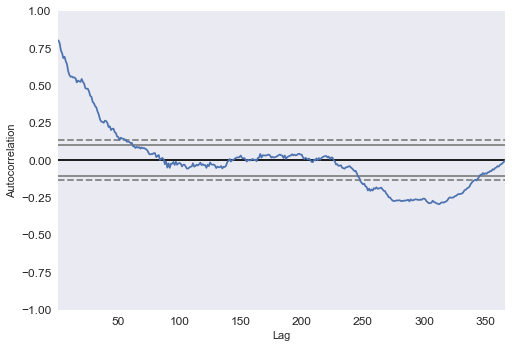

In [41]:
from pandas.tools.plotting import autocorrelation_plot

plt.figure()
autocorrelation_plot(MC_sys)

## r-band

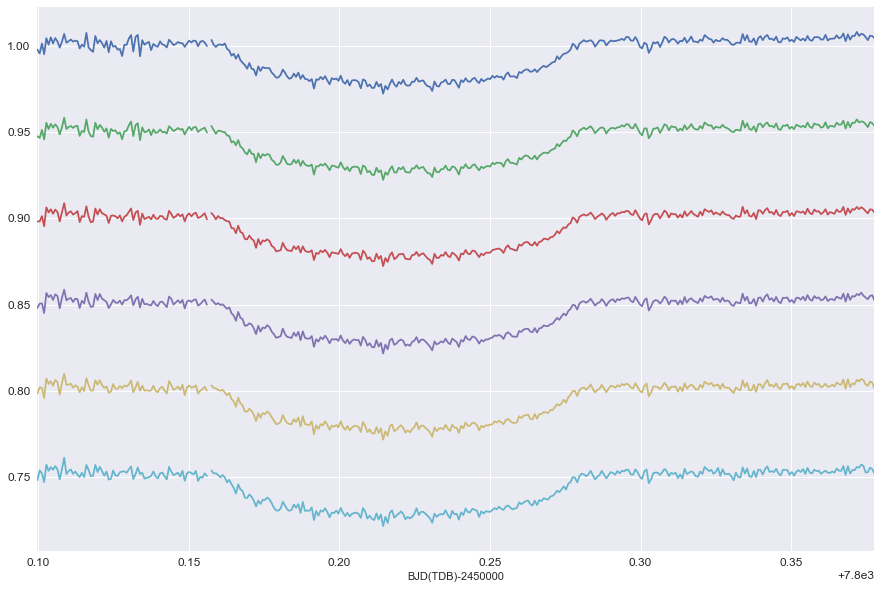

In [42]:
#target_star_id='2'
#comparison_star_id='1'#13, #3
#radii_range='9-14'

#fluxes
df=DF['g']
fluxes=df[df.columns[7:][::2]]
fluxes=fluxes[np.abs(fluxes-fluxes.mean())<=(3*fluxes.std())]
#add vertical offset
offset=0.05
for i,col in enumerate(fluxes.columns):
    fluxes[col].apply(lambda x : x-offset*i).plot(figsize=(15,10))

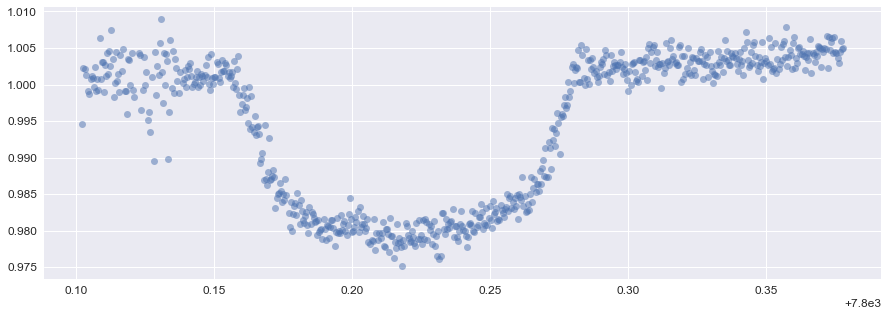

In [43]:
idx=6 #flux(r=9.0)
key='r'
df_r=DF[key]
#move frame column
df_r=df_r.drop('frame', axis=1)
#remove outliers
df_r=df_r[np.abs(df_r-df_r.mean())<=(3*df_r.std())]
#dropna
df_r=df_r.dropna(axis=0)

#clip the right side of baseline
clip=40
#df_z=df_z[:-clip]

t=df_r.index.values
f=df_r[df_r.columns[idx]].values

fig = plt.figure(figsize=(15,5))
plt.plot(t, f, 'o', alpha=0.5)

In [44]:
#df_r=DF[key]

#excluded outliers
uncertainty=df_r['err(r=9.0)'].values#.dropna()
peak_flux=df_r['peak(ADU)'].values#.dropna()
fwhm = df_r['fwhm(pix)'].values#.dropna()
xcenter = df_r['dx(pix)'].values#.dropna()
ycenter = df_r['dy(pix)'].values#.dropna()

In [45]:
print ("NLL before: {}".format(nll(theta, t, f, p, fwhm, uncertainty, xcenter, ycenter)))
result = op.minimize(nll, theta, args=(t, f, p, fwhm, uncertainty, xcenter, ycenter), method='nelder-mead')
print ("NLL after: {}".format(nll(result.x, t, f, p, fwhm, uncertainty, xcenter, ycenter)))

NLL before: -2971.47010372
NLL after: -3455.24722515


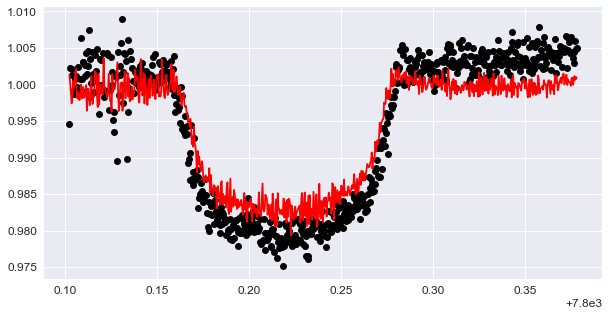

In [46]:
f_pred = loglike(result.x, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True)
fig = plt.figure(figsize=(10,5))
plt.plot(t, f, 'ko', t, f_pred, 'r-')

In [47]:
from emcee import MHSampler, EnsembleSampler
from emcee.utils import sample_ball
from tqdm import tqdm

ndim = len(theta)
nwalkers = 8 * ndim if ndim > 12 else 16 * ndim
nsteps1 = 1000

args = t, f, p, fwhm, uncertainty, xcenter, ycenter
sampler = EnsembleSampler(nwalkers, ndim, logprob,
    args=args, threads=1)

#random initial condition
pos0 = sample_ball(theta, [1e-4]*ndim, nwalkers)
'''pos0 = [np.array(initial) + 1e-8 * np.random.randn(ndim)
      for i in xrange(nwalkers)]'''

#begin
for pos,_,_ in tqdm(sampler.sample(pos0, iterations=nsteps1)):
    pass

1000it [02:37,  9.05it/s]


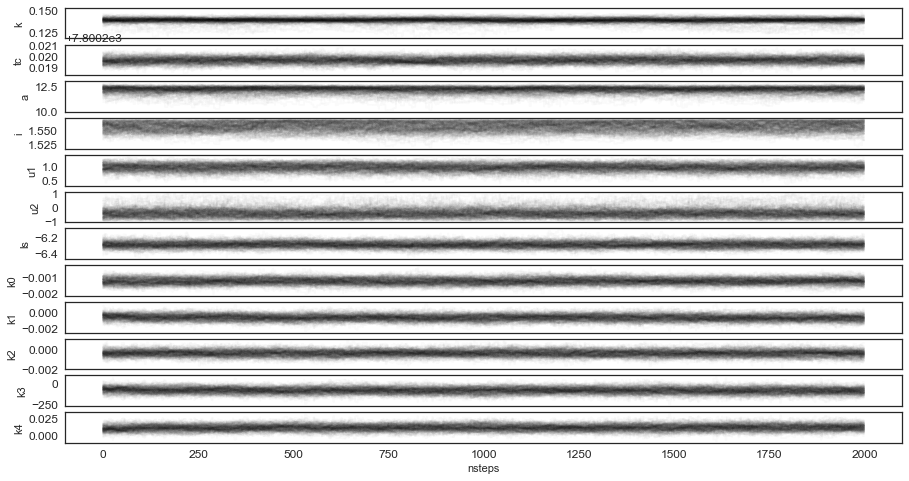

In [48]:
with sb.axes_style('white'):
    nwalkers, nsteps, ndim = chain.shape
    fig, axs = plt.subplots(ndim, 1, figsize=(15,ndim/1.5), sharex=True)
    [axs.flat[i].plot(c, drawstyle='steps', color='k', alpha=4./nwalkers) for i,c in enumerate(chain.T)]
    [axs.flat[i].set_ylabel(l) for i,l in enumerate(param_names)]
    
plt.xlabel('nsteps')

In [49]:
sampler.reset()
for pos,_,_ in tqdm(sampler.sample(pos, iterations=nsteps2)):
    pass

2000it [03:07, 13.92it/s]


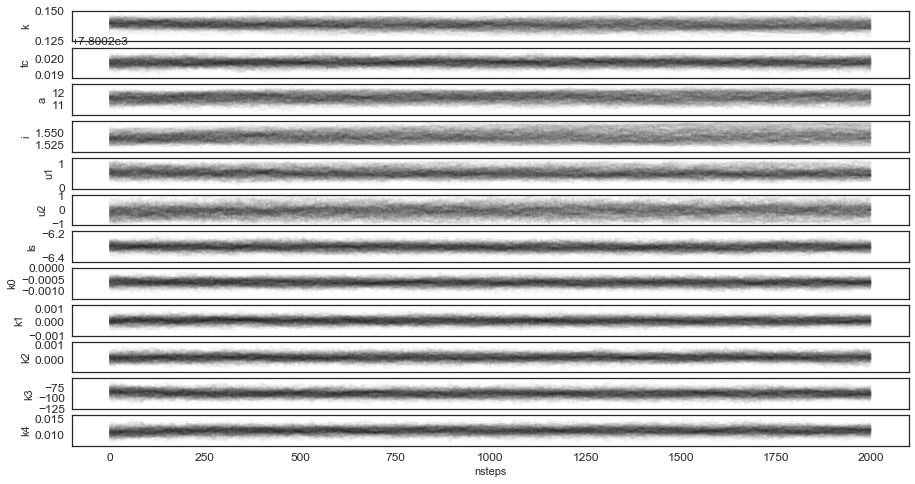

In [50]:
chain = sampler.chain

with sb.axes_style('white'):
    nwalkers, nsteps, ndim = chain.shape
    fig, axs = plt.subplots(ndim, 1, figsize=(15,ndim/1.5), sharex=True)
    [axs.flat[i].plot(c, drawstyle='steps', color='k', alpha=4./nwalkers) for i,c in enumerate(chain.T)]
    [axs.flat[i].set_ylabel(l) for i,l in enumerate(param_names)]
    
plt.xlabel('nsteps')

In [51]:
#using full chain excluding burn-in
max_idx=np.argmax(sampler.flatlnprobability)

#posterior of parameter vector
pv=sampler.flatchain[max_idx]
pv

array([  1.38321620e-01,   7.80021988e+03,   1.16914674e+01,
         1.54271470e+00,   5.73623819e-01,  -2.73727253e-02,
        -6.31635644e+00,  -6.16960958e-04,   5.58016286e-05,
         1.88799233e-04,  -9.27104626e+01,   1.18864938e-02])

In [52]:
final_theta['r']=pv

In [53]:
#posteriors: draw 100 random from fc
mod_sys = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]
sys = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_sys=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]
mod = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_mod=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]

In [54]:
n=0
d2 = {'r_flux': f, 'r_mod': mod[n], 'r_sys':sys[n], 'r_full': mod_sys[n], 'r(f-sys)': f-sys[n]}
df2=pd.DataFrame(data=d2, index=t)
df2.head()

,r(f-sys),r_flux,r_full,r_mod,r_sys
7800.102262,0.994856,0.994577,0.999721,1.0,-0.000279
7800.102655,1.002583,1.002315,0.999732,1.0,-0.000268
7800.103442,1.001979,1.002062,1.000083,1.0,0.000083
7800.103836,1.000690,1.001321,1.000631,1.0,0.000631
7800.104230,0.998527,0.999072,1.000545,1.0,0.000545


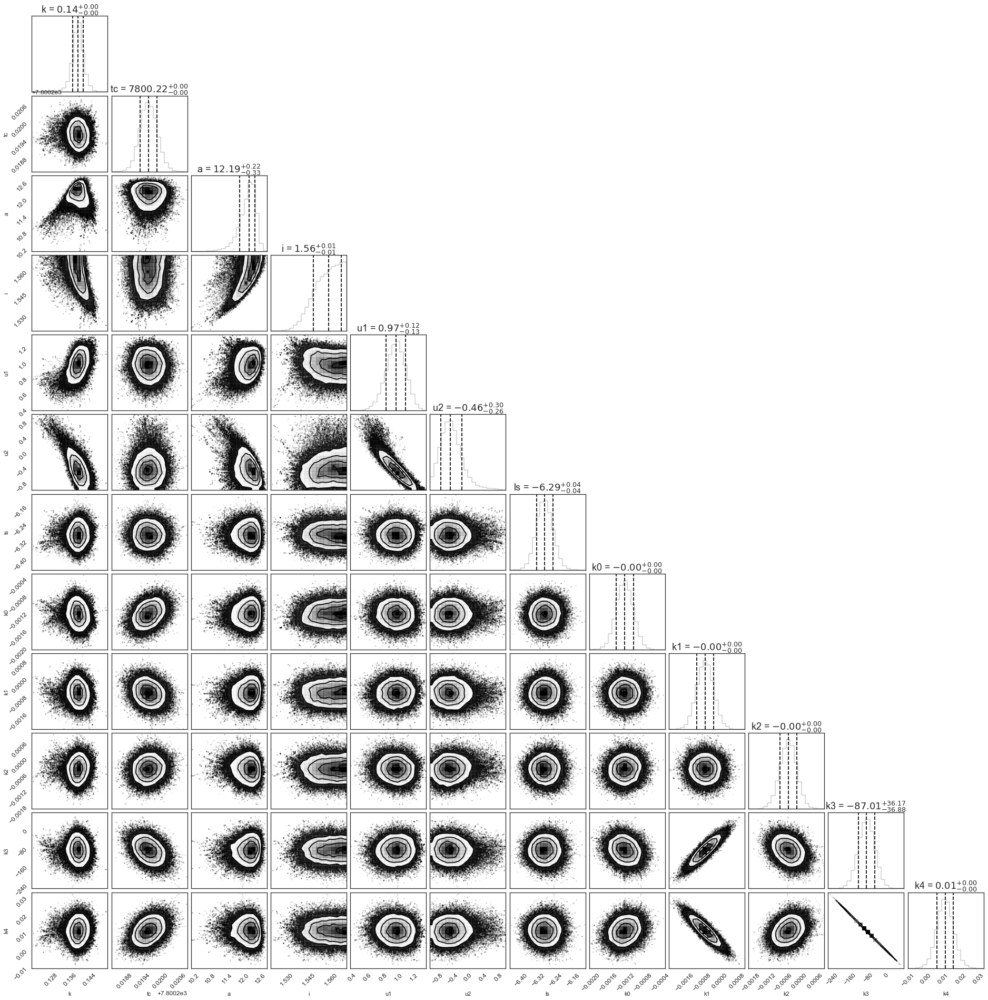

In [55]:
import corner

with sb.axes_style('white'):
    corner.corner(fc, labels=param_names, 
                  quantiles=[0.16, 0.5, 0.84], 
                  show_titles=True, title_kwargs={"fontsize": 18});

/home/jp/miniconda2/envs/moscatel/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.
  after removing the cwd from sys.path.


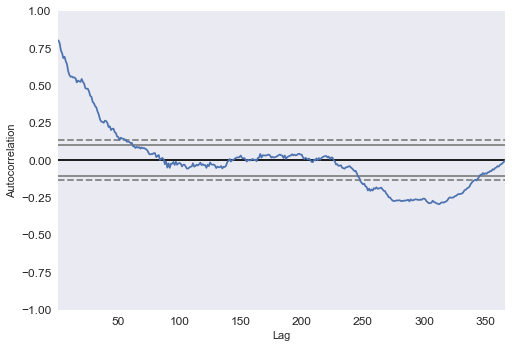

In [56]:
from pandas.tools.plotting import autocorrelation_plot

plt.figure()
autocorrelation_plot(MC_sys)

## z-band

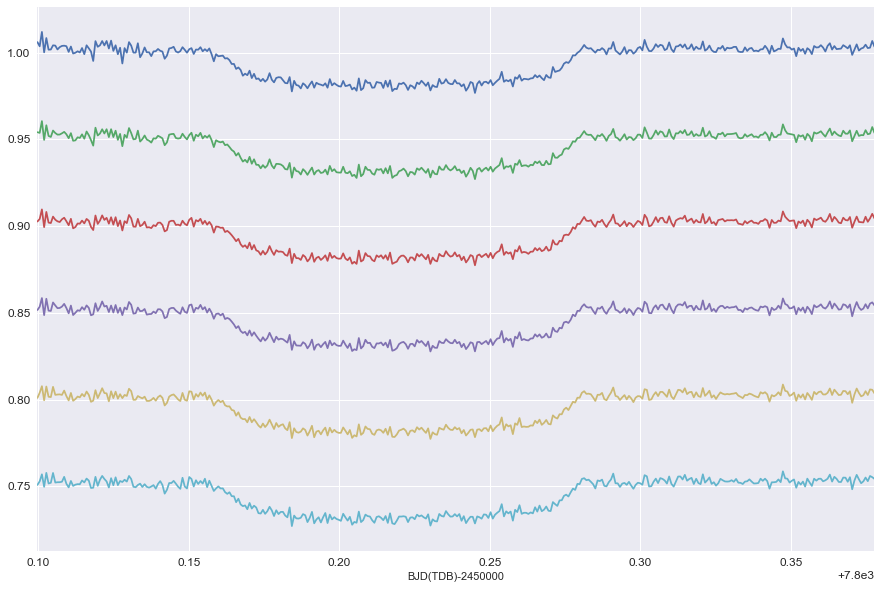

In [57]:
#target_star_id='2'
#comparison_star_id='1'#13, #3
#radii_range='9-14'

#fluxes
df=DF['z']
fluxes=df[df.columns[7:][::2]]
fluxes=fluxes[np.abs(fluxes-fluxes.mean())<=(3*fluxes.std())]
#add vertical offset
offset=0.05
for i,col in enumerate(fluxes.columns):
    fluxes[col].apply(lambda x : x-offset*i).plot(figsize=(15,10))

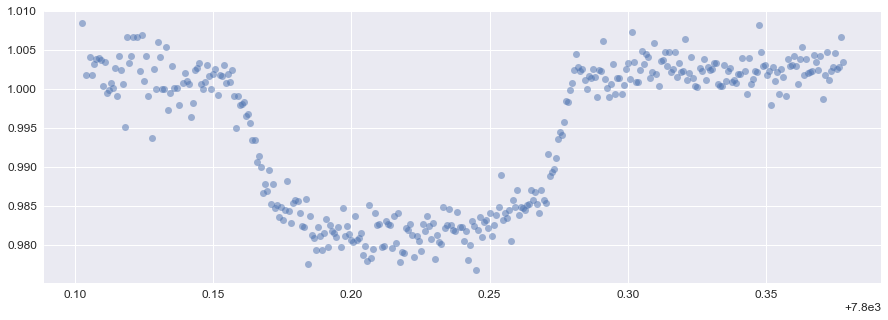

In [58]:
idx=6 #flux(r=9.0)
key='z'
df_z=DF[key]
#move frame column
df_z=df_z.drop('frame', axis=1)
#remove outliers
df_z=df_z[np.abs(df_z-df_z.mean())<=(3*df_z.std())]
#dropna
df_z=df_z.dropna(axis=0)

#clip the right side of baseline
clip=40
#df_z=df_z[:-clip]

t=df_z.index.values
f=df_z[df_z.columns[idx]].values

fig = plt.figure(figsize=(15,5))
plt.plot(t, f, 'o', alpha=0.5)

In [59]:
#df_r=DF[key]

#excluded outliers
uncertainty=df_z['err(r=9.0)'].values#.dropna()
peak_flux=df_z['peak(ADU)'].values#.dropna()
fwhm = df_z['fwhm(pix)'].values#.dropna()
xcenter = df_z['dx(pix)'].values#.dropna()
ycenter = df_z['dy(pix)'].values#.dropna()

In [60]:
print ("NLL before: {}".format(nll(theta, t, f, p, fwhm, uncertainty, xcenter, ycenter)))
result = op.minimize(nll, theta, args=(t, f, p, fwhm, uncertainty, xcenter, ycenter), method='nelder-mead')
print ("NLL after: {}".format(nll(result.x, t, f, p, fwhm, uncertainty, xcenter, ycenter)))

NLL before: -1605.38342975
NLL after: -2008.063847


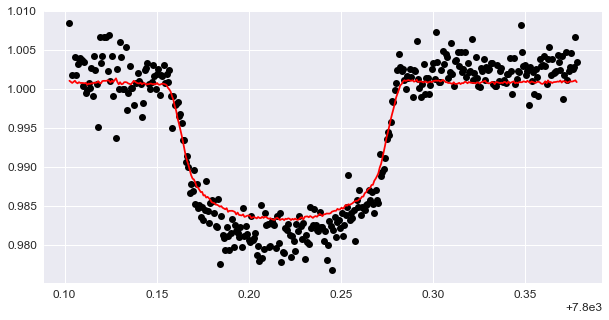

In [61]:
f_pred = loglike(result.x, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True)
fig = plt.figure(figsize=(10,5))
plt.plot(t, f, 'ko', t, f_pred, 'r-')

In [62]:
from emcee import MHSampler, EnsembleSampler
from emcee.utils import sample_ball
from tqdm import tqdm

ndim = len(theta)
nwalkers = 8 * ndim if ndim > 12 else 16 * ndim
nsteps1 = 1000

args = t, f, p, fwhm, uncertainty, xcenter, ycenter
sampler = EnsembleSampler(nwalkers, ndim, logprob,
    args=args, threads=1)

#random initial condition
pos0 = sample_ball(theta, [1e-4]*ndim, nwalkers)
'''pos0 = [np.array(initial) + 1e-8 * np.random.randn(ndim)
      for i in xrange(nwalkers)]'''

#begin
for pos,_,_ in tqdm(sampler.sample(pos0, iterations=nsteps1)):
    pass

1000it [01:20, 12.45it/s]


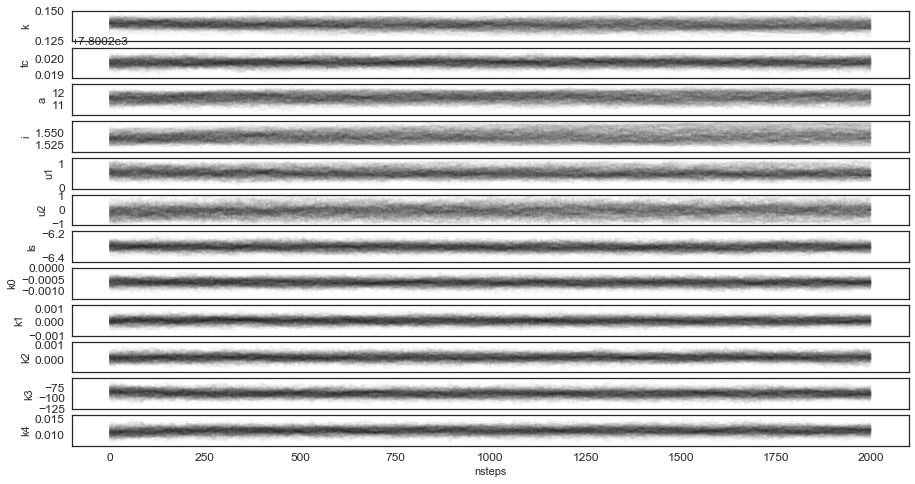

In [63]:
with sb.axes_style('white'):
    nwalkers, nsteps, ndim = chain.shape
    fig, axs = plt.subplots(ndim, 1, figsize=(15,ndim/1.5), sharex=True)
    [axs.flat[i].plot(c, drawstyle='steps', color='k', alpha=4./nwalkers) for i,c in enumerate(chain.T)]
    [axs.flat[i].set_ylabel(l) for i,l in enumerate(param_names)]
    
plt.xlabel('nsteps')

In [64]:
sampler.reset()
for pos,_,_ in tqdm(sampler.sample(pos, iterations=nsteps2)):
    pass

2000it [02:33,  6.30it/s]


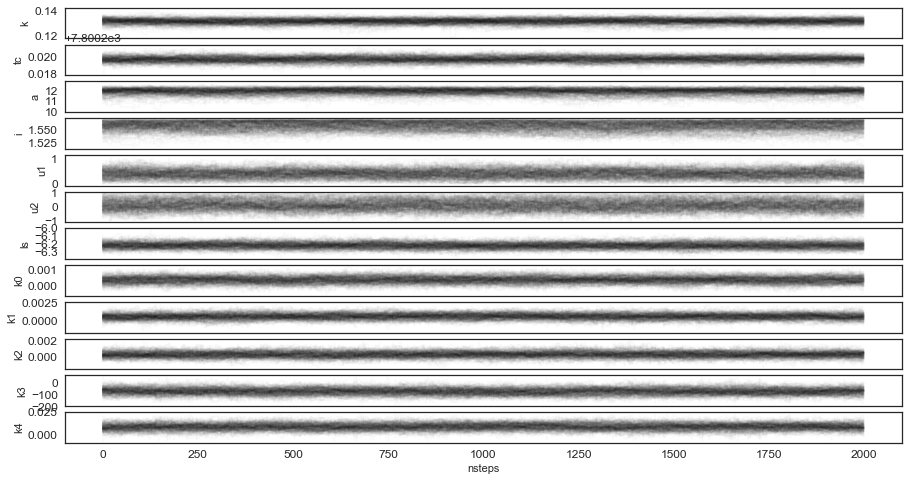

In [65]:
chain = sampler.chain

with sb.axes_style('white'):
    nwalkers, nsteps, ndim = chain.shape
    fig, axs = plt.subplots(ndim, 1, figsize=(15,ndim/1.5), sharex=True)
    [axs.flat[i].plot(c, drawstyle='steps', color='k', alpha=4./nwalkers) for i,c in enumerate(chain.T)]
    [axs.flat[i].set_ylabel(l) for i,l in enumerate(param_names)]
    
plt.xlabel('nsteps')

In [66]:
#using full chain excluding burn-in
max_idx=np.argmax(sampler.flatlnprobability)

#posterior of parameter vector
pv=sampler.flatchain[max_idx]
pv

array([  1.31476947e-01,   7.80021952e+03,   1.21833227e+01,
         1.56703318e+00,   4.37250724e-01,   4.09970581e-02,
        -6.22634595e+00,   3.14129000e-04,   8.03857163e-04,
         2.74405717e-04,  -7.48213700e+01,   9.59212234e-03])

In [67]:
#
final_theta['z']=pv

In [68]:
#posteriors: draw 100 random from fc
mod_sys = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_full=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]
sys = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_sys=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]
mod = [loglike(pv, t, f, p, fwhm, uncertainty, xcenter, ycenter, ret_mod=True) for th in fc[np.random.randint(0, fc.shape[0], size=100)]]

In [69]:
n=0
d3 = {'z_flux': f, 'z_mod': mod[n], 'z_sys':sys[n], 'z_full': mod_sys[n], 'z(f-sys)': f-sys[n]}
df3=pd.DataFrame(data=d3, index=t)
df3.head()

,z(f-sys),z_flux,z_full,z_mod,z_sys
7800.102655,1.006425,1.008416,1.001991,1.0,0.001991
7800.104149,1.000005,1.001797,1.001792,1.0,0.001792
7800.105631,1.002652,1.004066,1.001414,1.0,0.001414
7800.106360,0.999495,1.001821,1.002326,1.0,0.002326
7800.107101,1.001236,1.003172,1.001936,1.0,0.001936


In [70]:
frames = [df1, df2, df3]

final_df = pd.concat(frames)
final_df.tail()

,g(f-sys),g_flux,g_full,g_mod,g_sys,r(f-sys),r_flux,r_full,r_mod,r_sys,z(f-sys),z_flux,z_full,z_mod,z_sys
7800.374841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.002120,1.004588,1.002468,1.0,0.002468
7800.375582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000176,1.002619,1.002443,1.0,0.002443
7800.376323,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000234,1.002866,1.002632,1.0,0.002632
7800.377063,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.004055,1.006726,1.002671,1.0,0.002671
7800.377793,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.001027,1.003414,1.002387,1.0,0.002387


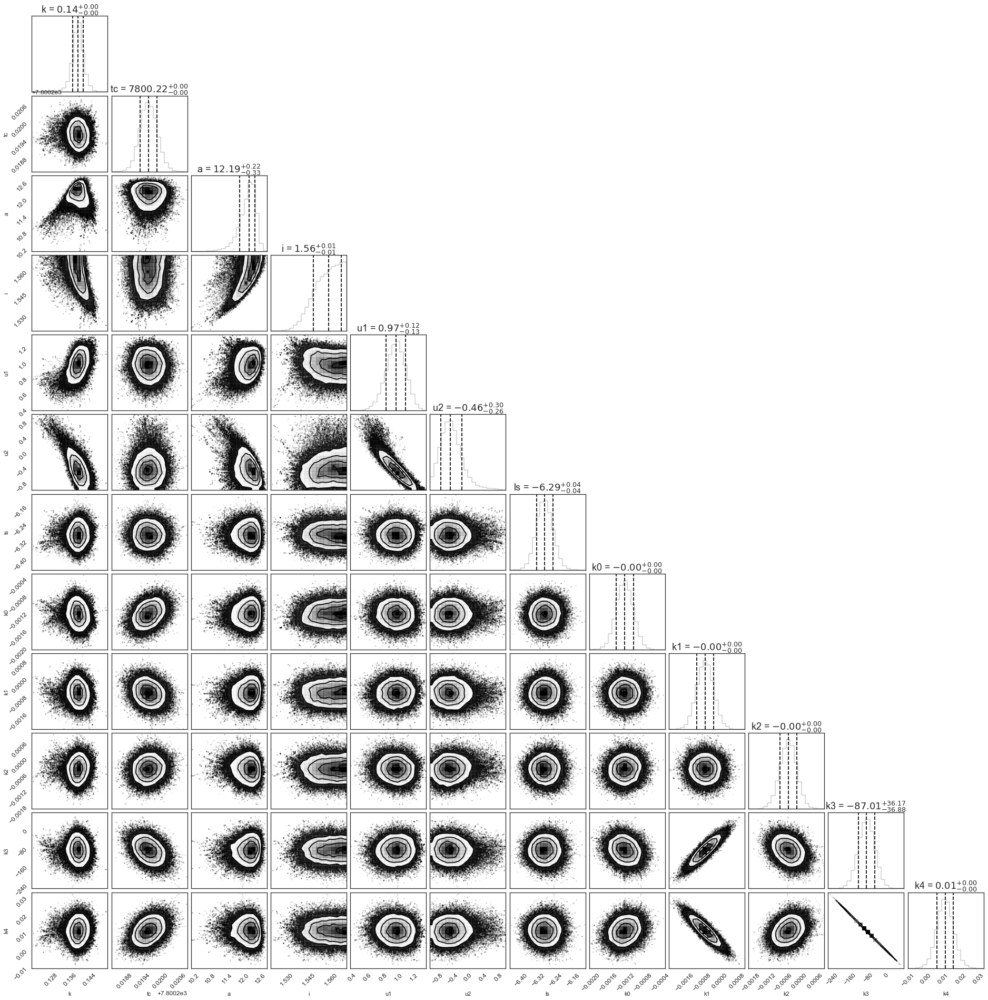

In [71]:
import corner

with sb.axes_style('white'):
    corner.corner(fc, labels=param_names, 
                  quantiles=[0.16, 0.5, 0.84], 
                  show_titles=True, title_kwargs={"fontsize": 18});

/home/jp/miniconda2/envs/moscatel/lib/python2.7/site-packages/ipykernel_launcher.py:4: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.
  after removing the cwd from sys.path.


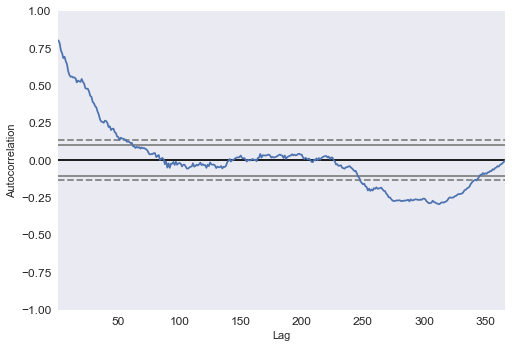

In [72]:
from pandas.tools.plotting import autocorrelation_plot

plt.figure()
autocorrelation_plot(MC_sys)

## Full model

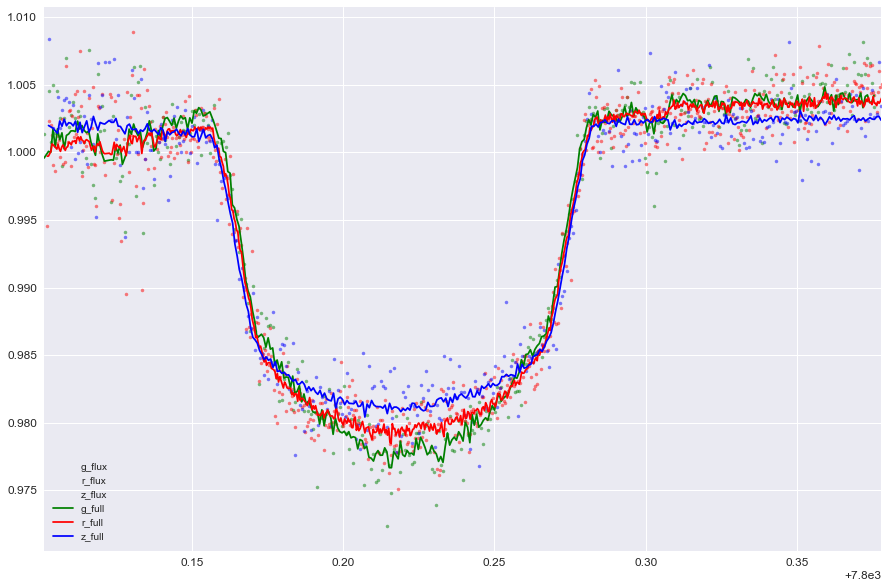

In [87]:
fig,ax=plt.subplots(1,1,figsize=(15,10))
cols='g_flux,r_flux,z_flux'.split(',')
#colors=['g','r','b']
final_df[cols].plot(marker='.', linestyle='', ax=ax,alpha=0.5,color=colors)
cols2='g_full,r_full,z_full'.split(',')
final_df[cols2].plot(ax=ax, color=colors)

## Corrected

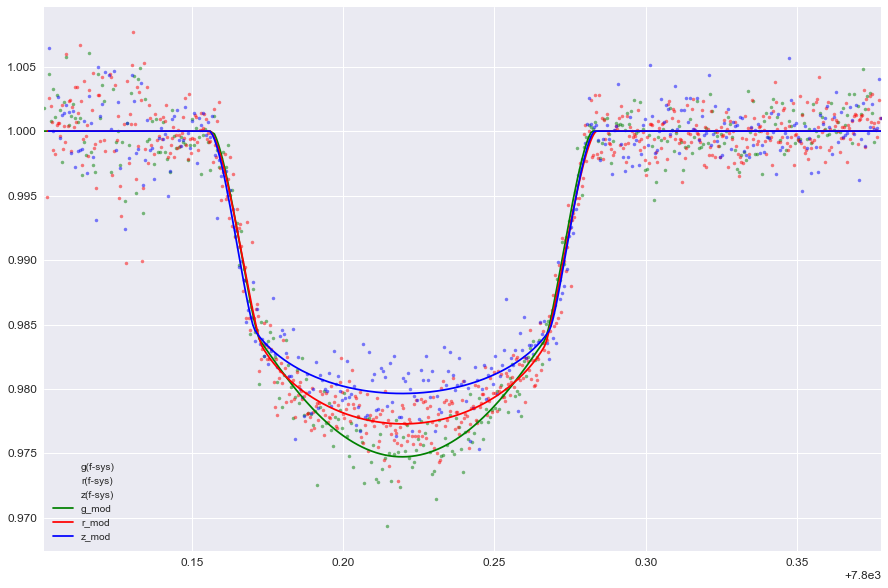

In [73]:
fig,ax=plt.subplots(1,1,figsize=(15,10))
cols='g(f-sys),r(f-sys),z(f-sys)'.split(',')
colors=['g','r','b']
final_df[cols].plot(marker='.',alpha=0.5, linestyle='', color=colors, ax=ax)
cols2='g_mod,r_mod,z_mod'.split(',')
final_df[cols2].plot(ax=ax, color=colors)

In [74]:
final_df.to_csv('final_grz.csv')

In [75]:
final_theta

{'g': array([  1.39091575e-01,   7.80021956e+03,   1.23091359e+01,
          1.55799997e+00,   1.04078154e+00,  -5.94422738e-01,
         -6.31099751e+00,  -1.22807142e-03,  -3.90144826e-04,
         -5.24408282e-04,  -5.97472826e+01,   7.66117066e-03]),
 'r': array([  1.38321620e-01,   7.80021988e+03,   1.16914674e+01,
          1.54271470e+00,   5.73623819e-01,  -2.73727253e-02,
         -6.31635644e+00,  -6.16960958e-04,   5.58016286e-05,
          1.88799233e-04,  -9.27104626e+01,   1.18864938e-02]),
 'z': array([  1.31476947e-01,   7.80021952e+03,   1.21833227e+01,
          1.56703318e+00,   4.37250724e-01,   4.09970581e-02,
         -6.22634595e+00,   3.14129000e-04,   8.03857163e-04,
          2.74405717e-04,  -7.48213700e+01,   9.59212234e-03])}

In [76]:
df_theta=pd.DataFrame(final_theta)
df_theta['names']=param_names
df_theta

,g,r,z,names
0,0.139092,0.138322,0.131477,k
1,7800.219561,7800.219878,7800.219518,tc
2,12.309136,11.691467,12.183323,a
3,1.558000,1.542715,1.567033,i
4,1.040782,0.573624,0.437251,u1
5,-0.594423,-0.027373,0.040997,u2
6,-6.310998,-6.316356,-6.226346,ls
7,-0.001228,-0.000617,0.000314,k0
8,-0.000390,0.000056,0.000804,k1
9,-0.000524,0.000189,0.000274,k2


In [77]:
df_theta.to_csv('theta_post.csv')

(-0.10000000000000001,
 2.1000000000000001,
 0.0074499045014716474,
 0.012097759997744305)

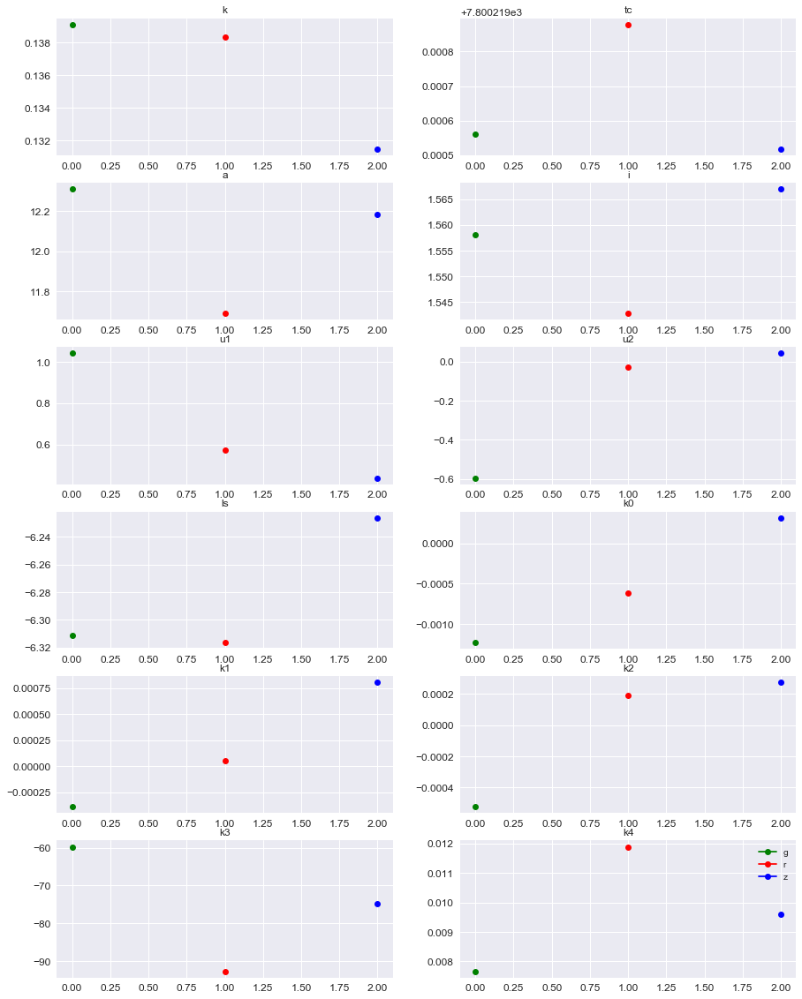

In [78]:
fig = plt.figure(figsize=(15,20))
#colors=
for idx,key in enumerate(sorted(final_theta)):
    for num, p in enumerate(range(len(final_theta[key]))):
        ax=plt.subplot(len(final_theta[key])/2,2,num+1)
        ax.plot(idx,final_theta[key][p], marker='o', color=colors[idx], label=key);
        ax.set_title(param_names[p])
plt.legend()
plt.axis('tight')

In [79]:
fname='hatp44b_grz.png'
plt.savefig(fname, bbox_inches='tight')

## Residuals

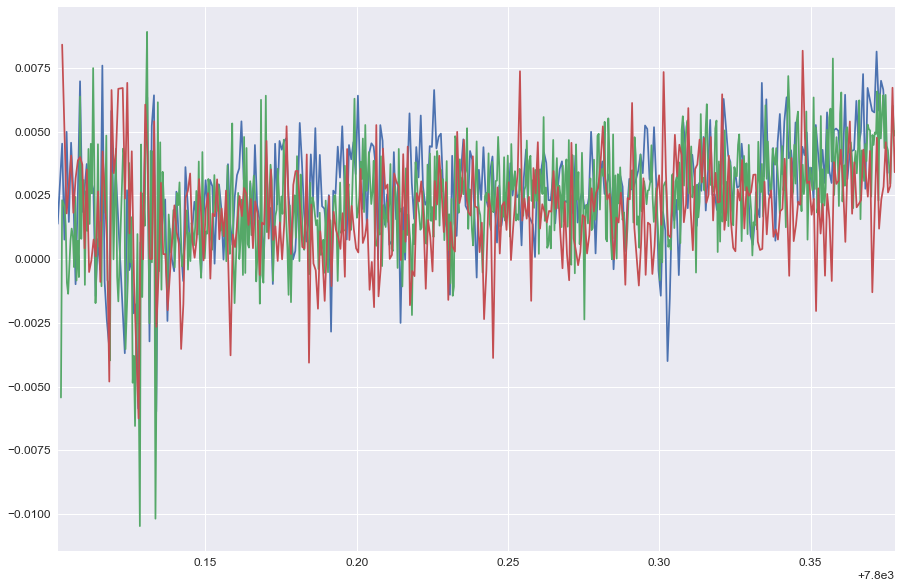

In [80]:
fig,ax=plt.subplots(1,1,figsize=(15,10))
diff1=final_df['g_flux'] - final_df['g_mod']
diff1.plot(ax=ax)
diff2=final_df['r_flux'] - final_df['r_mod']
diff2.plot(ax=ax)
diff3=final_df['z_flux'] - final_df['z_mod']
diff3.plot(ax=ax)

## Systematics

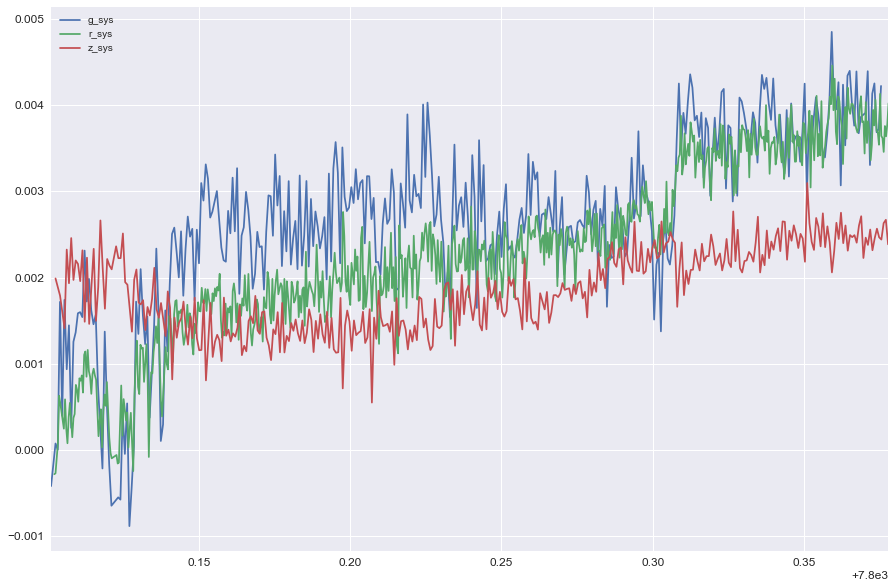

In [81]:
fig,ax=plt.subplots(1,1,figsize=(15,10))
cols3='g_sys,r_sys,z_sys'.split(',')
final_df[cols3].plot(ax=ax)

## To Do:

* use beta
* how to choose best light curves
* 